## Project Name = *Simulation of Padestrian-induced vibrations of a Footbridge (2D surface) By using the Duhamel Intergral*.
## Student Name = *Anuraj Bose* 
## Roll No : *26301319063*
## College : Regent Education and Research Foundation, Barrackpore.
## Dept of CSE & CE 
## Group : Single - Final Year Project Part I & II

    # Calling DEPENDENCIES and DEFAULTS 

In [1]:
import math #.....................................Math functionality
import numpy as np #..............................Numpy for working with arrays
import matplotlib.pyplot as plt #.................Plotting functionality 

# Index No 6 from Content Table Analytical Solution (to the Duhamel Intergal)

In [3]:
import sympy as sym #Importing SymPy
sym.init_printing() #printing formed equation

#Define some symbols to built the integration more pronounced
m = sym.Symbol('m')
w = sym.Symbol('w')
P0 = sym.Symbol('P0')
t1 = sym.Symbol('t1')
tau = sym.Symbol('tau')
t = sym.Symbol('t')

#Constructing the function to integrate
f = tau * sym.sin(w*t-w*tau)

# Use SymPy to get the definite itegral with respect to tau between 0 and t
defInt = sym.integrate(f,(tau,0,t)) 

print('\n SymPy generated the following expression for the definite integral:\n')
sym.simplify(defInt) #Attempt to simplify the definite integral


 SymPy generated the following expression for the definite integral:



⎧t⋅w - sin(t⋅w)                            
⎪──────────────  for w > -∞ ∧ w < ∞ ∧ w ≠ 0
⎪       2                                  
⎨      w                                   
⎪                                          
⎪      0                 otherwise         
⎩                                          

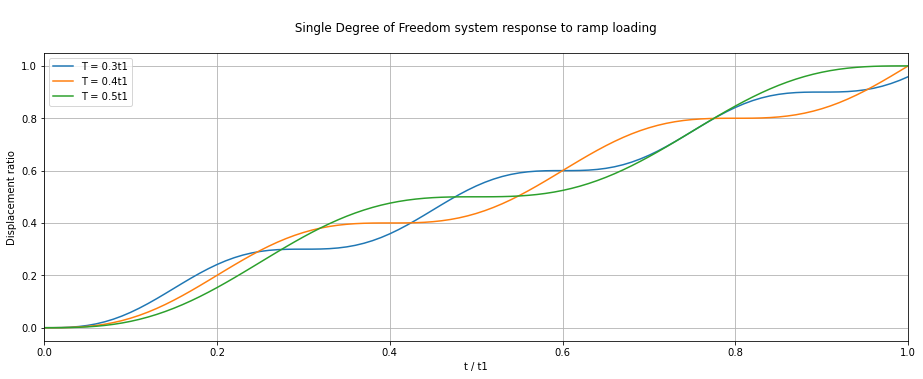

In [4]:
P0 = 1000 #(N) Max load (arbitrary value for visualisation only)
t1 = 10 #(sec) Rise time (arbitrary value for visualisation only)
delT = 0.1 #(sec) Time-step
t = np.arange(0, t1+delT, delT) #Time vector defyning steps of delT
p = P0*t/t1 #Force vector

m=20 #Mass of the system_constant
periodRange = [0.3,0.4,0.5] #Range of system periods as a propertion of rise time

#Initialise a figrue to plot onto
fig = plt.figure() #defyning figure below
axes = fig.add_axes([0.1,0.1,2,1]) 

for pr in periodRange: #starting a loop through array of numbers preriodrange    
    T = pr*t1
    wn = 2*math.pi/T
    k=m*wn**2
    u = (P0/k)*((t/t1)-((np.sin(wn*t))/(wn*t1)))
    axes.plot(t/t1,u/(P0/k), label=f"T = {pr}t1")    

#Housekeeping
axes.set_xlabel('t / t1')
axes.set_ylabel('Displacement ratio')
axes.set_title('\n Single Degree of Freedom system response to ramp loading \n')
axes.legend(loc='upper left')
axes.set_xlim([0,1]) #making plot line to axis system to this below grid
plt.grid()
plt.show()

# Index 8 Implementing the numerical solution i.e. (to the Duhamel Intergal)

In [5]:
m = 1000 #(kg) Mass
xi = 0.05 # Damping ratio
f = 1.5 #(Hz) Natural frequency
wn = 2*math.pi*f #(rads/s) Angular natural frequency
wd = wn*math.sqrt(1-xi**2) #(rads/s) Damped angular natural frequency

In [6]:
tMax = 20 #(s) Max time
delT = 0.01 #(s) Time-step
time = np.arange(0, tMax+delT, delT) #Time vector

f_Force = 1 #(Hz) Forcing frequency
wf = 2*math.pi*f_Force #(rads/s) Angular forcing frequency
P=100 #(N) Force amplitude loading
force = P*np.sin(wf*time) #Force vector

Since we're integrating with respect to τ we can restructure our expression to isolate the terms requiring numerical integration,


\begin{equation}
u(t) = A e^{-\xi \omega_n t} \sin (\omega_d t) - Be^{-\xi\omega_n t} \cos (\omega_d t)
\end{equation}

where,

\begin{equation}
A = \frac{1}{m\omega_d} \int_0^t e^{\xi \omega_n \tau} F(\tau)\cos(\omega_d\tau)\mathrm{d}\tau
\end{equation}

\begin{equation}
A = \frac{1}{m\omega_d} \int_0^t e^{\xi \omega_n \tau} F(\tau)\sin(\omega_d\tau)\mathrm{d}\tau
\end{equation}


In [7]:
#Defyning Duhamel function with Time Vector 'T' and Force Vector 'F'
def Duhamel(T, F):
    #Initialise a container of zeros to hold the displacement values
    U = np.zeros(len(T))
    
    #Initialise values for the cumulative sum used to calculate A and B at each time-step
    ACum_i=0 
    BCum_i=0
    
    #Cycle through the time vector and evaluate the response at each time point
    for i, t in enumerate(T):
        #Only start calculating on the second iteration (need two values for trapezoidal area calculation)
        if i>0:     
            #Calculate A[i] - equation 4
            y_i = math.e**(xi*wn*T[i]) * F[i] * math.cos(wd*T[i]) #Value of integrand at current time-step
            y_im1 = math.e**(xi*wn*T[i-1]) * F[i-1] * math.cos(wd*T[i-1]) #Value of integrand at previous time-step
            Area_i = 0.5*delT*(y_i+y_im1) #Area of trapezoid
            ACum_i += Area_i #Cumulative area from t=0 to current time
            A_i = (1/(m*wd))*ACum_i #Value of A for the current time-step
            
            #Calculate B[i] - equation 5 (same notes as for A above)
            y_i = math.e**(xi*wn*T[i]) * F[i] * math.sin(wd*T[i])
            y_im1 = math.e**(xi*wn*T[i-1]) * F[i-1] * math.sin(wd*T[i-1])
            Area_i = 0.5*delT*(y_i+y_im1)
            BCum_i += Area_i
            B_i = (1/(m*wd))*BCum_i                
                  
            #Calculate the response - equation 3
            U[i] = A_i*math.e**(-xi*wn*T[i])*math.sin(wd*T[i]) - B_i * math.e**(-xi*wn*T[i])*math.cos(wd*T[i])             
            
    return U

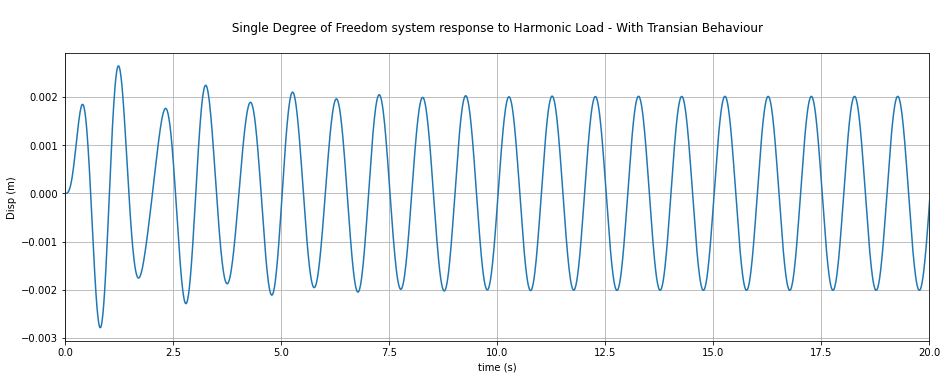

In [10]:
response = Duhamel(time, force) #Response calculated using the Duhamel integral function

#Initialise a fig to plot onto
fig = plt.figure() 
axes = fig.add_axes([0.1,0.1,2,1]) 
axes.plot(time,response)    

#Housekeeping
axes.set_xlabel('time (s)')
axes.set_ylabel('Disp (m)')
axes.set_title('\n Single Degree of Freedom system response to Harmonic Load - With Transian Behaviour \n')
axes.set_xlim([0,tMax])
plt.grid()
plt.show()

# Index No 9. Validating our numerical solution

Now we'll confirm the validity of our Duhamel function by comparing the calculated response with the closed-form (analytical) solution for harmonic loading of a Single Degree of Freedom system. We could plot the complete closed-form response including the transient and steady-state components but for our validation exercise it will be sufficient to only plot the steady-state response, $u_s(t)$ given by,


\begin{equation}
u_s(t) = \frac{P}{k}\left[ \frac{1}{(1-\beta^2)^2 + (2\xi\beta)^2} \right] \left[ (1-\beta^2)\sin(\omega t)-2\xi\beta\cos(\omega t) \right]
\end{equation}



In [11]:
#Steady-state response with the system
beta = wf/wd #Frequency ratio
k=m*wd**2 #(N/m) Stiffness

#Break equation into two for convenience
O = (P/k)*(1/((1-beta**2)**2 + (2*xi*beta)**2))
response_cf = O*((1-beta**2)*np.sin(wf*time) - 2*xi*beta*np.cos(wf*time)) #here xi is defined globally previously

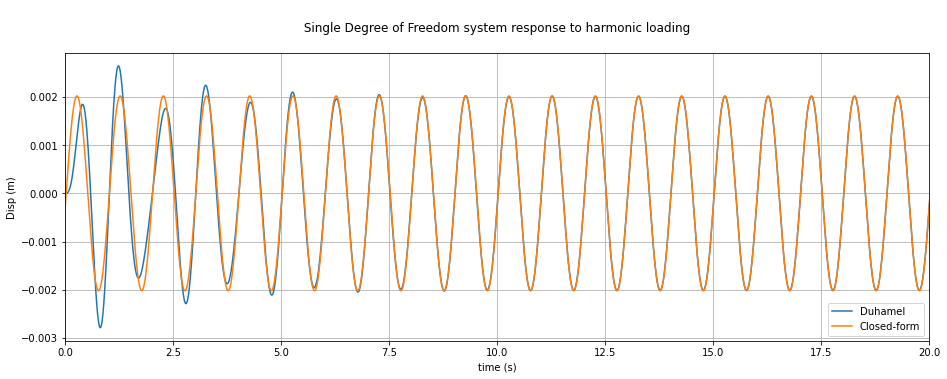

 
 Dumahel's response and is the actual reponse that continiues to the left to end but, But trasnian responde will first will not copt up with the Duhamel's response but after 2.5-5s of time it will i.e. Closed form response and Duhamal's Response will match after Trasnsation reponse liniared away 


In [16]:
fig = plt.figure() 
axes = fig.add_axes([0.1,0.1,2,1]) 
axes.plot(time,response, '-', label='Duhamel')  
axes.plot(time,response_cf,'-',label='Closed-form') 

#Housekeeping
axes.set_xlabel('time (s)')
axes.set_ylabel('Disp (m)')
axes.set_title('\n Single Degree of Freedom system response to harmonic loading \n')
axes.legend(loc='lower right')
axes.set_xlim([0,tMax])
plt.grid()
plt.show()

print(" \n Dumahel's response and is the actual reponse that continiues to the left to end but, But trasnian responde will first will not copt up with the Duhamel's response but after 2.5-5s of time it will i.e. Closed form response and Duhamal's Response will match after Trasnsation reponse liniared away ")

# Index 10. Dynamic Crowd Load—Concept

In [17]:
L = 60 #(m) Bridge span
vp = 1.3 #(m/s) Pedestrian walking velocity
tMax = L/vp #(s) Crossing time of bridge
m = 65 #(kg) Avarage Indian Pedestrian mass weight
G = 9.81*m #(N) Static weight of pedestrian

fv = 0.35*vp**3 - 1.59*vp**2 + 2.93*vp #(Hz) Pacing frequency
DLF = 0.41*(fv-0.95) #Dynamic load factor
print(f"- The Dynamic Load Factor = {round(DLF,3)} and the pacing frequency is {round(fv,2)} Hz ({round(fv,2)} steps per second)")
print(f"- Duration of a single step is {round(1/fv,2)} seconds")

- The Dynamic Load Factor = 0.386 and the pacing frequency is 1.89 Hz (1.89 steps per second)
- Duration of a single step is 0.53 seconds


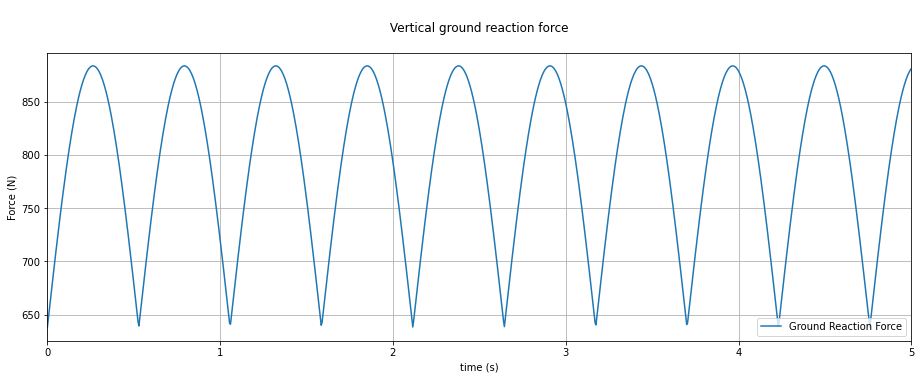

In [20]:
delT = 0.005 #(s) Time-step
time = np.arange(0, tMax+delT, delT) #Time vector
Fv = G + abs(G*DLF*np.sin(2*math.pi*(fv/2)*time)) #Static + Dynamic Ground Reaction Force

fig = plt.figure() 
axes = fig.add_axes([0.1,0.1,2,1]) 
axes.plot(time,Fv, '-', label='Ground Reaction Force')  

#Housekeeping
axes.set_xlabel('time (s)')
axes.set_ylabel('Force (N)')
axes.set_title('\n Vertical ground reaction force \n')
axes.legend(loc='lower right')
axes.set_xlim([0,5])
plt.grid()
plt.show()

# Index no 11. Dynamic analysis: Bridge + 1 pedestrian

In [21]:
xp = vp*time #Pedestrian position as a function of time
phi = np.sin(math.pi*xp/L) #Mode shape at pedestrian's location
Fn = Fv*phi #Modal force experienced by SDoF system

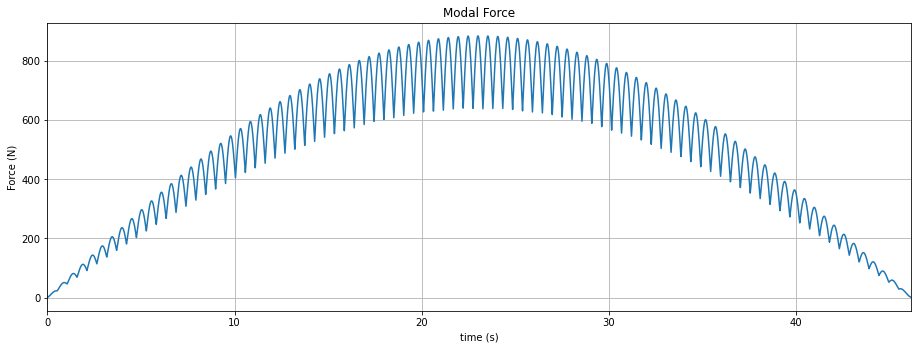


	 Dynamic Influance of the Padestrian on the first mode of Vibration growing to maximum at MID SPAN

 This is a Modeal Force Diagram for 1 Pedestrian is moving through start to end of a bridge and foot fall force has been scaled in Mode shape Value


In [28]:
fig = plt.figure() 
axes = fig.add_axes([0.1,0.1,2,1]) 
axes.plot(time,Fn, '-', label='Modal load')  

#Housekeeping
axes.set_xlabel('time (s)')
axes.set_ylabel('Force (N)')
axes.set_title('Modal Force')
axes.set_xlim([0,tMax])
plt.grid()
plt.show()
print("\n\t Dynamic Influance of the Padestrian on the first mode of Vibration growing to maximum at MID SPAN")

print("\n This is a Modeal Force Diagram for 1 Pedestrian is moving through start to end of a bridge and foot fall force has been scaled in Mode shape Value")


In [29]:
M = 2000 #(kg/m) Mass per unit length]
m = 0.5*M*L #(kg) Modal mass of mode 1
xi = 0.025 #Damping ratio
fn = 2.5 #(Hz) Bridge modal frequency
wn = 2*math.pi*fn #(rads/s) Angular modal frequency
wd = wn*math.sqrt(1-xi**2) #(rads/s) Damped angular modal frequency

In [30]:
response = Duhamel(time, Fn) #Response calculated using the Duhamel integral function

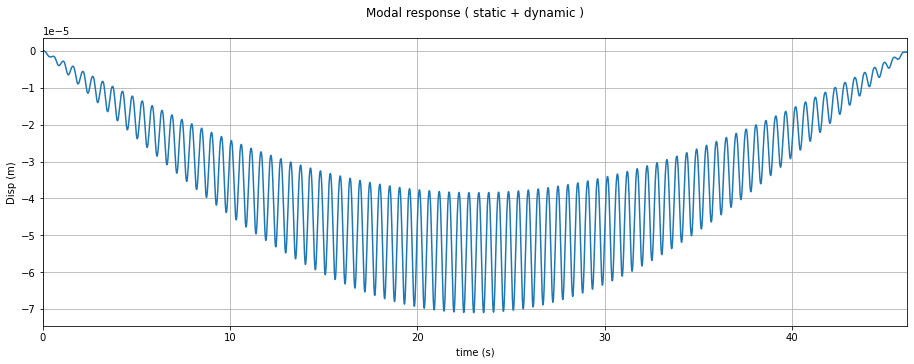

	 This visualisation reflects the vertical oscillating of a Bridge when 1 Padestrian is moving 


In [38]:
fig = plt.figure() 
axes = fig.add_axes([0.1,0.1,2,1]) 
axes.plot(time,-response, '-')  

#Housekeeping
axes.set_xlabel('time (s)')
axes.set_ylabel('Disp (m)')
axes.set_title('Modal response ( static + dynamic )\n') 
axes.set_xlim([0,tMax])
plt.grid()
plt.show()

print("\t This visualisation reflects the vertical oscillating of a Bridge when 1 Padestrian is moving ")

In [39]:
Fn_static = G*phi #Static component of GRF
Fn_dynamic = abs(G*DLF*np.sin(2*math.pi*(fv/2)*time))*phi #Dynamic component of GRF

response_static = Duhamel(time, Fn_static) #Response due to constant magnitude moving load
response_dynanmic = Duhamel(time, Fn_dynamic) #Response due to footsteps (with static load component removed)

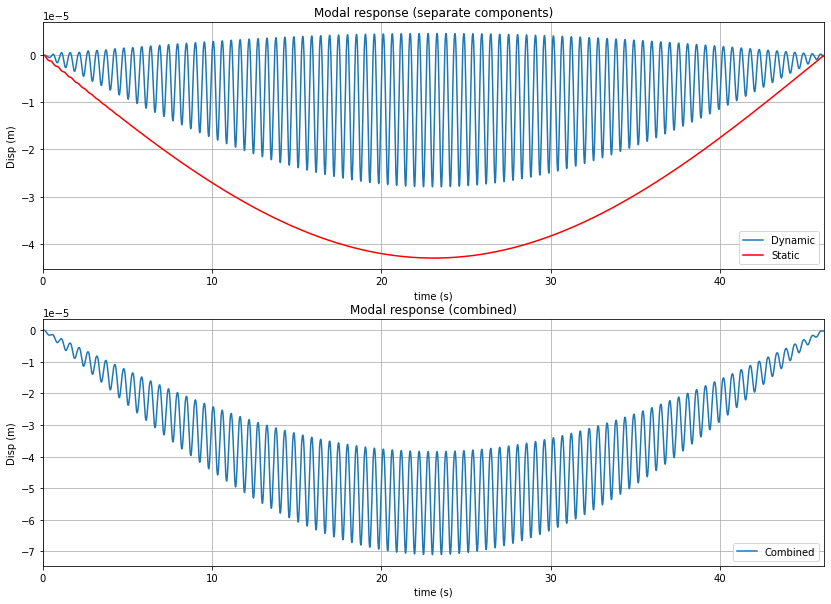

In [42]:
fig, axes = plt.subplots(figsize=(14,10),nrows=2,ncols=1) 
axes[0].plot(time,-response_dynanmic, '-', label='Dynamic')  
axes[0].plot(time,-response_static, 'r-', label='Static') 
axes[0].set_xlabel('time (s)')
axes[0].set_ylabel('Disp (m)')
axes[0].set_title('Modal response (separate components)')
axes[0].legend(loc='lower right')
axes[0].set_xlim([0,tMax])
axes[0].grid()

axes[1].plot(time,-response, '-', label='Combined')  
axes[1].set_xlabel('time (s)')
axes[1].set_ylabel('Disp (m)')
axes[1].set_title('Modal response (combined)')
axes[1].legend(loc='lower right')
axes[1].set_xlim([0,tMax])
axes[1].grid()

plt.show()

print(" \n Here, Upper Graph ")

In [43]:
def Peaks(disp, time):
    #Initialise containers to hold peaks and their times
    peaks = np.empty([1,0]) 
    times = np.empty([1,0])
    
    #Calculate slopes for each data point
    slopes = np.zeros(len(disp))
    for i, u in enumerate(disp):
        if(i<len(disp)-1):
            slopes[i] = disp[i+1]-disp[i]
    
    #Cycle through all slopes and pick out peaks
    for i, s in enumerate(slopes):
        if (i<len(slopes)-1):
            if(slopes[i+1]<0 and slopes[i]>0):
                peaks = np.append(peaks,disp[i])
                times = np.append(times,time[i])
                
    return [peaks, times]                     

In [44]:
peaks, times = Peaks(response,time)

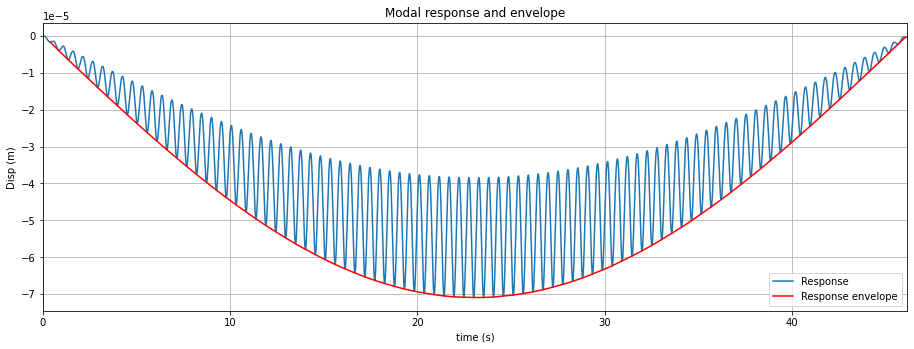

In [45]:
fig = plt.figure() 
axes = fig.add_axes([0.1,0.1,2,1]) 
axes.plot(time,-response, '-', label='Response')  
axes.plot(times,-peaks,'r-', label='Response envelope')

#Housekeeping
axes.set_xlabel('time (s)')
axes.set_ylabel('Disp (m)')
axes.set_title('Modal response and envelope')
axes.legend(loc='lower right')
axes.set_xlim([0,tMax])
plt.grid()
plt.show()

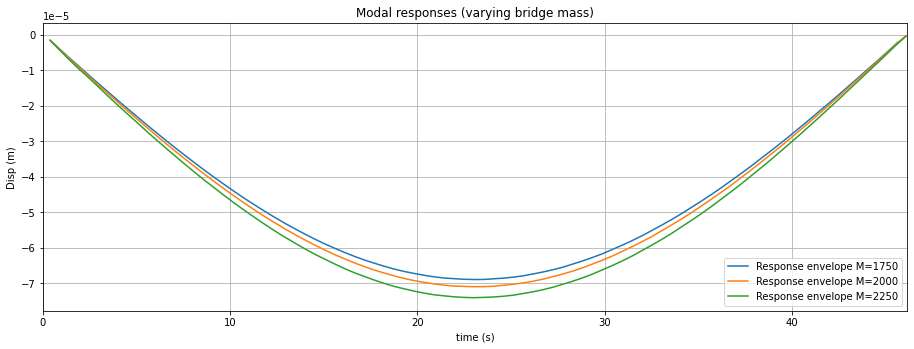

In [46]:
k = m*wn**2 #(N/m) Original system stiffness
Masses = [1750, 2000, 2250] #(kg/m) Masses per unit length to test

fig = plt.figure() 
axes = fig.add_axes([0.1,0.1,2,1])

for M in Masses:    
    m = 0.5*M*L #(kg) Modal mass of mode 1
    wn = math.sqrt(k/m)
    wd = wn*math.sqrt(1-xi**2) #(rads/s) Damped angular modal frequency
        
    response = Duhamel(time, Fn) #Response calculated using the Duhamel integral function
    peaks, times = Peaks(response,time)
    
#     axes.plot(time,response,'-', label=f'Response M={M}')
    axes.plot(times,-peaks,'-', label=f'Response envelope M={M}')
    
#Housekeeping
axes.set_xlabel('time (s)')
axes.set_ylabel('Disp (m)')
axes.set_title('Modal responses (varying bridge mass)')
axes.legend(loc='lower right')
axes.set_xlim([0,tMax])
plt.grid()
plt.show()

print(" This is the Response Curve with Three Diffrent Situation ")

# Index No 12.Dynamic Analysis: Bridge + N pedestrian

In [62]:
N = 100 #Number of pedestrians that cross the bridge in the time window
window = 10*60 #(s) #Simulation window
buffer = 200 #(s) Additional seconds to allow simulation of response beyond window length (late finishers)
mp = 65 #(kg) AS per Indian Avg. Padestrian Weight
G = 9.81*mp #(N) Static weight of pedestrian

In [49]:
#Random variables
tStart = np.random.uniform(low=0.0, high=window, size=N) #Uniformly distributed start times
Vp = np.random.normal(loc=1.3, scale=0.125, size=N) #Normally distributed walking velocities

In [50]:
#Set up the simulation time vector
tMax = window + buffer #(s) Max time
time = np.arange(0, tMax+delT, delT) 

#Initialise containers to hold the individual forces and responses calculated for each pedestrian
crowdForce = np.zeros([N,len(time)])
crowdResponse = np.zeros([N,len(time)])

#For each pedestrian...
for i, n in enumerate(np.arange(N)):    
    vp = Vp[i] #(m/s) Walking velocity
    startTime = tStart[i] #(s) Start time    
    tCross = L/vp #(s) Crossing time
    tEnd = startTime + tCross #(s) Finish time    

    fv = 0.35*vp**3 - 1.59*vp**2 + 2.93*vp #(Hz) Pacing frequency
    DLF = 0.41*(fv-0.95) #Dynamic load factor
    
    timeVector = np.arange(0, tCross+delT, delT) #Time vector for this pedestrian
    Fv = G + abs(G*DLF*np.sin(2*math.pi*(fv/2)*timeVector)) #Static + Dynamic GRF (ignore static component)
    
    xp = vp*timeVector #Position as a function of time
    phi = np.sin(math.pi*xp/L) #Mode shape at pedestrian's location
    Fn = Fv*phi #Modal force experienced by SDoF system
    
    response = Duhamel(timeVector, Fn) #Response calculated using the Duhamel integral function
    
    #Save the GRF and response for this pedestrian at the correct position in the overal simulation records
    iStart = round(startTime/delT) #Index for start time
    crowdForce[i, iStart:iStart+len(Fn)] = Fn
    crowdResponse[i,iStart:iStart+len(Fn)] = response

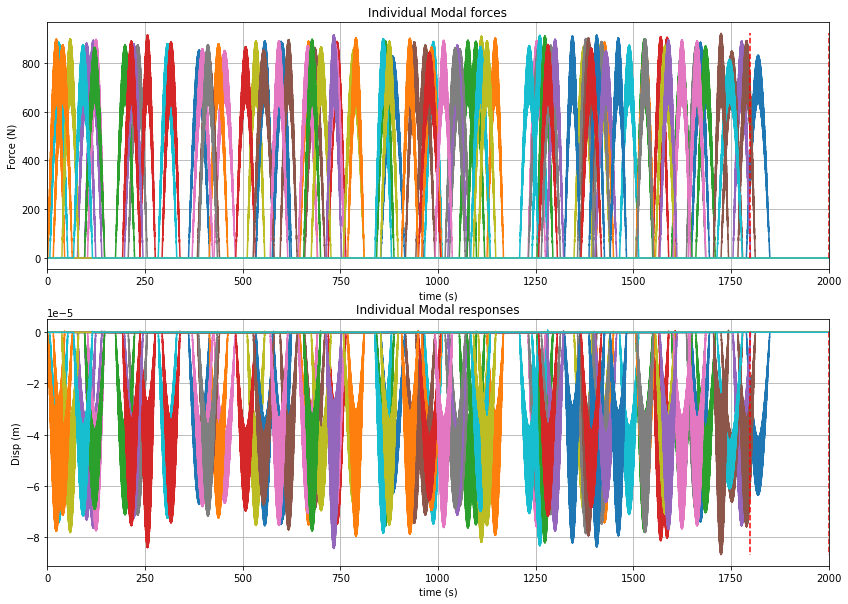

In [53]:
fig, axes = plt.subplots(figsize=(14,10),nrows=2,ncols=1)

for i in np.arange(len(crowdForce)):    
    axes[0].plot(time,crowdForce[i,:],'-')
    axes[1].plot(time,-crowdResponse[i,:],'-')

#Housekeeping
axes[0].plot([window, window],[0,np.max(crowdForce)],'r--')    
axes[0].plot([window+buffer, window+buffer],[0,np.max(crowdForce)],'r--')  
axes[0].set_xlabel('time (s)')
axes[0].set_ylabel('Force (N)')
axes[0].set_title('Individual Modal forces')
axes[0].set_xlim([0,tMax])
# axes[0].set_xlim([startTime,startTime+tCross])
axes[0].grid()

axes[1].plot([window, window],[0,-np.max(crowdResponse)],'r--')    
axes[1].plot([window+buffer, window+buffer],[0,-np.max(crowdResponse)],'r--')  
axes[1].set_xlabel('time (s)')
axes[1].set_ylabel('Disp (m)')
axes[1].set_title('Individual Modal responses')
axes[1].set_xlim([0,tMax])
# axes[1].set_xlim([startTime,startTime+tCross])
axes[1].grid()

plt.show()

In [54]:
#Sum across rows of crowdForce and crowdResponse
F_Crowd = sum(crowdForce)
Res_crowd = sum(crowdResponse)

In [55]:
peaks, times = Peaks(Res_crowd,time)

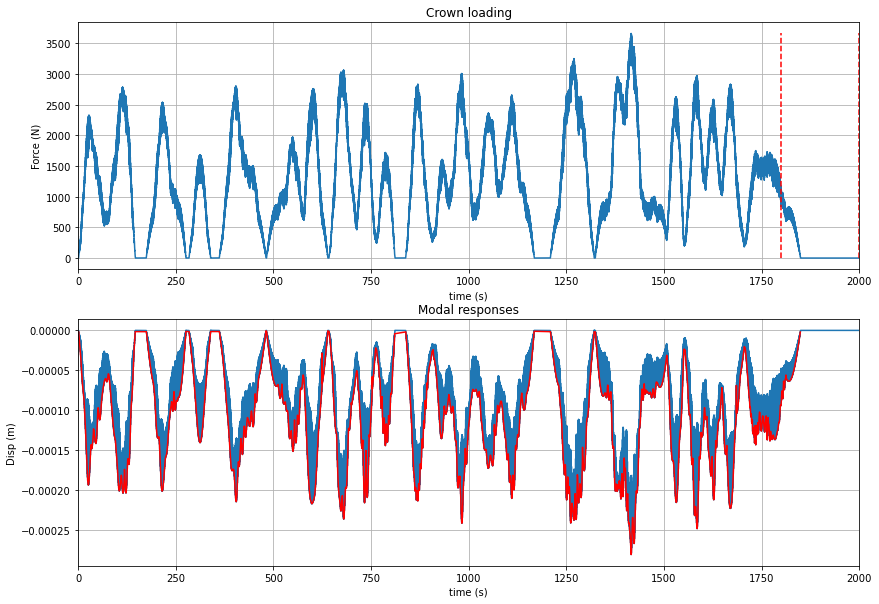

In [56]:
fig, axes = plt.subplots(figsize=(14,10),nrows=2,ncols=1) 

axes[0].plot(time,F_Crowd,'-')
axes[1].plot(time,-Res_crowd,'-')
axes[1].plot(times,-peaks,'r-')

axes[0].plot([window, window],[0,max(F_Crowd)],'r--')    
axes[0].plot([window+buffer, window+buffer],[0,max(F_Crowd)],'r--')  
axes[0].set_xlabel('time (s)')
axes[0].set_ylabel('Force (N)')
axes[0].set_title('Crown loading')
axes[0].set_xlim([0,tMax])
axes[0].grid()

axes[1].set_xlabel('time (s)')
axes[1].set_ylabel('Disp (m)')
axes[1].set_title('Modal responses')
axes[1].set_xlim([0,tMax])
axes[1].grid()

plt.show()

# Index No 13. Animation Concept of Bridge Response and Traffic Flow

In [57]:
from matplotlib.animation import FuncAnimation
import matplotlib.gridspec as gridspec
%matplotlib notebook

In [58]:
#Animation parameters
animLength = 100 #(sec)
frameRate = 12 #(5,10,20) frames per second (too high and animation slows down)
plotInterval = 1/frameRate #(sec) time between frame plots
dataInterval = int(plotInterval/delT) #Plot moving elements every 'dataInterval-th' point
defScale = 500 #Scale factor on bridge deflection (for visibility)

<IPython.core.display.Javascript object>


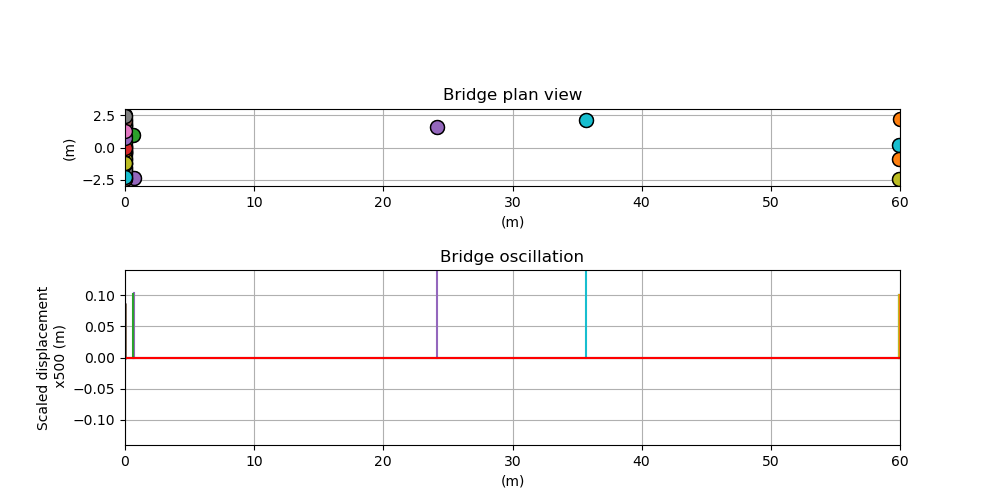

In [59]:
fig, (ax1,ax2) = plt.subplots(nrows=2,ncols=1, figsize=(10, 5)) #Define figure and subplots
gs = gridspec.GridSpec(2,1,height_ratios=[1,1]) #Control subplot layout
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

ax1.set_aspect('equal', adjustable='box') #Set equal scale for axes top subplot

#Set axis limits
ax1.set_xlim([0,L])
ax1.set_ylim([-3, 3])
yLim2 = defScale*max(Res_crowd)
ax2.set_xlim([0,L])
ax2.set_ylim([-yLim2, yLim2])

#Housekeeping
ax1.set_title('Bridge plan view')
ax1.set_xlabel('(m)')
ax1.set_ylabel('(m)')
ax1.grid()

ax2.set_title('Bridge oscillation')
ax2.set_xlabel('(m)')
ax2.set_ylabel(f'Scaled displacement\n x{defScale} (m)')
ax2.grid()

plt.show()

In [60]:
#Define initial state of pedestrians in top plot
topPedList = [] #Initialise an empty list to hold markers representing pedestrians
for i in np.arange(N): 
    yPos = np.random.uniform(low=-2.5, high=2.5, size=1) #Random positions across bridge deck width
    pedTop, = ax1.plot(0,yPos,'o', markeredgecolor='k', markersize=10)
    topPedList.append(pedTop)

#Define initial state of pedestrians in bottom plot
btmPedList = [] 
for i in np.arange(N): 
    ped, = ax2.plot([0,0],[0,0.6*yLim2])
    btmPedList.append(ped)
        
#Define the initial state of the beam in the bottom plot
xVals = np.arange(0,L+1,1) #An array of x-values along the beam
phiVals = np.sin(math.pi*xVals/L) #Corresponding y-values
beamDisp = 0*phiVals #Initial array of displacements along the beam

axisLine, = ax2.plot(xVals,beamDisp,'k') #Add a horizontal beam axis to plot
defLine, = ax2.plot(xVals,beamDisp,'r') #Add initial deflected shape to plot

In [61]:
#Function to animate plot objects
def animate(i):
    frm = int(i*dataInterval) #Index of data for this frame
    simTime = time[frm] #Simulation time for this animation frame
    
    #Update the pedestrian positions (top plot) for the current frame
    for i in np.arange(N):
        if(simTime>tStart[i] and simTime<tStart[i] + L/Vp[i]):
            Pt = topPedList[i]
            pos = (simTime - tStart[i])*Vp[i]
            Pt.set_xdata([pos, pos])
    
    
    #Update the beam deflected shape for the current frame
    defLine.set_data(xVals, -defScale*phiVals*Res_crowd[frm])
    
    #Update the pedestrian positions (bottom plot) for the current frame
    for i in np.arange(N):
        if(simTime>tStart[i] and simTime<tStart[i] + L/Vp[i]):
            Pb = btmPedList[i]
            pos = (simTime - tStart[i])*Vp[i]            
            h = 0.1 + 0.1*crowdForce[i,frm]/max(crowdForce[i,:])            
            Pb.set_data([pos, pos],[0,h])
    
    return

In [ ]:
#Function to generate the animation
myAnimation = FuncAnimation(fig, 
                            animate, 
                            frames=int(1 + (animLength/plotInterval) ),
                            interval=plotInterval*1000,  #milliseconds
                            blit=True, 
                            repeat=True)

plt.show()
myAnimation.save('Bridge_response.gif')

MovieWriter ffmpeg unavailable; using Pillow instead.


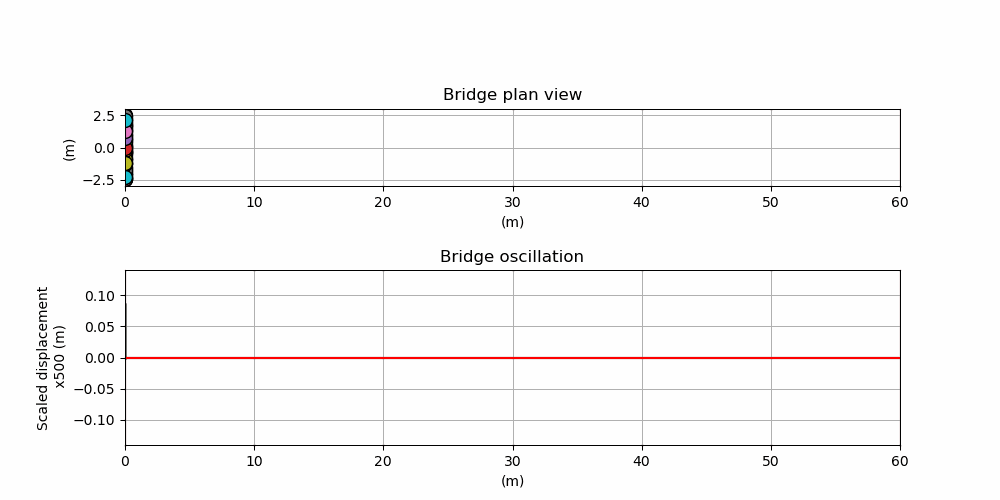